In [1]:
import os
import PIL
import torch
import random
import pandas as pd
from torch import nn
from PIL import Image
from tqdm.auto import tqdm
import torch.optim as optim
from torchvision import transforms
from torch.utils.data import Dataset
from matplotlib import pyplot as plt
from torch.utils.data import DataLoader
from torchvision.transforms import ToPILImage
from typing import Optional, List, Any, Tuple

In [2]:
CARTOON_FACES_DATASET_PATH = "./datasets/cartoonset100k_jpg"
IMAGE_SIZE = (64, 64)
BATCH_SIZE = 512
NOISE_SIZE = 100
LEARNING_RATE = 0.0002 * (BATCH_SIZE / 128)
BETA_1 = 0.5
BETA_2 = 0.999
NUM_EPOCHS = 100
SAVE_GENERATOR_CHECKPOINT_PATH = "./checkpoints/generator_checkpoint.pth"
SAVE_DISCRIMINATOR_CHECKPOINT_PATH = "./checkpoints/discriminator_checkpoint.pth"
SAVE_FAKE_IMAGES_PATH = "./fake_images"
SAVE_LOGS_PATH = "./logs/gan_training_logs.csv"

In [3]:
class CartoonFacesDataset(Dataset):
    def __init__(self,
                 root,
                 transform=None,
                 include_folders: Optional[List[str]] = None):
        self.root = root
        self.transform = transform
        if include_folders is None:
            self.folders = [d for d in os.listdir(self.root) if os.path.isdir(os.path.join(self.root, d))]
        else:
            self.folders = include_folders
        self.data = []
        for folder in self.folders:
            images_folder = os.path.join(self.root, folder)
            for file_name in os.listdir(images_folder):
                if file_name.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif')):
                    image_path = os.path.join(images_folder, file_name)
                    self.data.append(image_path)

    def __len__(self):
        return len(self.data)

    def __getitem__(self,
                    idx: int):
        image_path = self.data[idx]
        image = Image.open(image_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image

In [4]:
cartoon_faces_dataset = CartoonFacesDataset(root=CARTOON_FACES_DATASET_PATH, include_folders=["0", "1"])

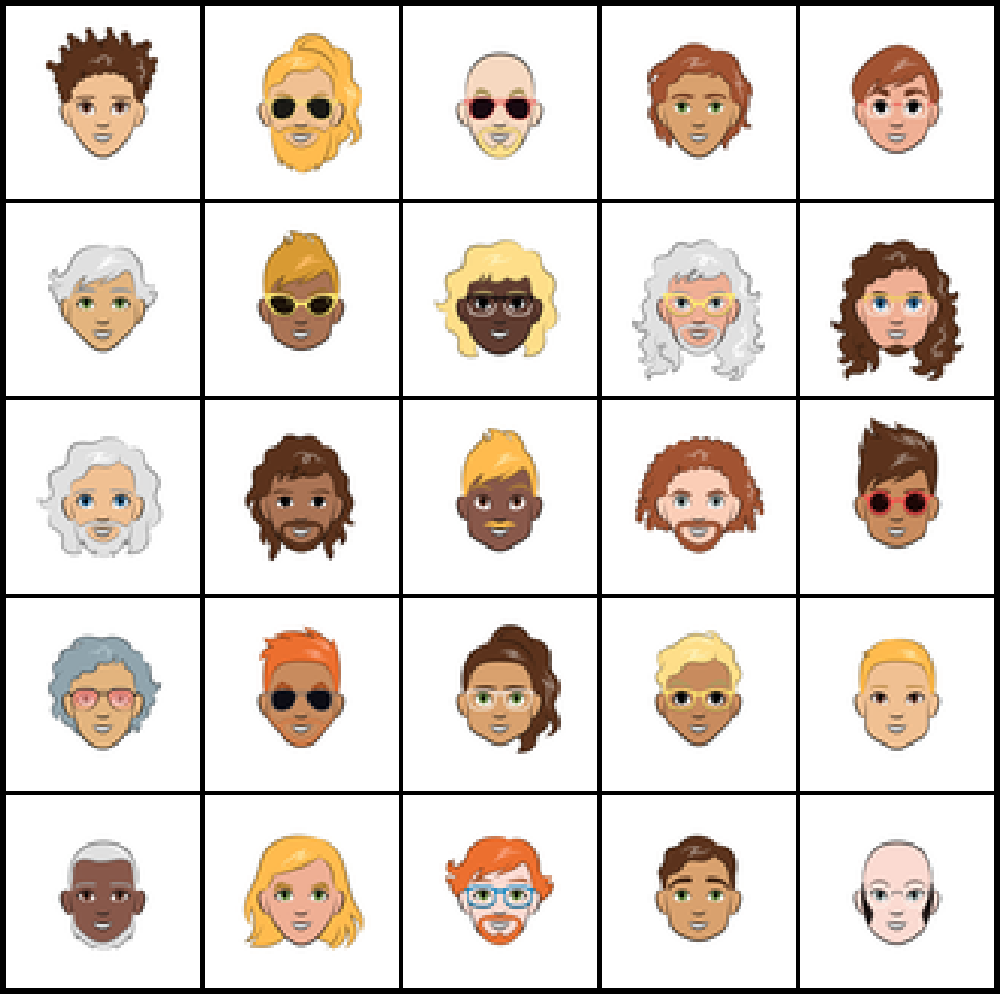

In [5]:
random.seed(42)
random_images_idx = [random.randint(0, len(cartoon_faces_dataset) - 1) for _ in range(25)]
plt.figure(figsize=(20, 20), facecolor='black')
plt.subplots_adjust(wspace=0.02, hspace=0.02)
for i, image_idx in enumerate(random_images_idx):
    image = cartoon_faces_dataset[image_idx]
    image = image.resize(IMAGE_SIZE, resample=Image.LANCZOS)
    plt.subplot(5, 5, i+1)
    plt.imshow(image)
    plt.axis("off")
plt.show()

In [6]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [7]:
def weights_init_normal(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [8]:
class Generator128(nn.Module):
    def __init__(self,
                 noise_size: int = 100,
                 feature_maps_size: int = 64,
                 image_channels: int = 3):
        super(Generator128, self).__init__()
        self.main = nn.Sequential(
            nn.ConvTranspose2d(noise_size, feature_maps_size * 16, kernel_size=4, stride=1, padding=0, bias=False),
            nn.BatchNorm2d(feature_maps_size * 16),
            nn.ReLU(True),

            nn.ConvTranspose2d(feature_maps_size * 16, feature_maps_size * 8, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(feature_maps_size * 8),
            nn.ReLU(True),

            nn.ConvTranspose2d(feature_maps_size * 8, feature_maps_size * 4, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(feature_maps_size * 4),
            nn.ReLU(True),

            nn.ConvTranspose2d(feature_maps_size * 4, feature_maps_size * 2, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(feature_maps_size * 2),
            nn.ReLU(True),

            nn.ConvTranspose2d(feature_maps_size * 2, feature_maps_size, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(feature_maps_size),
            nn.ReLU(True),

            nn.ConvTranspose2d(feature_maps_size, image_channels, kernel_size=4, stride=2, padding=1, bias=False),
            nn.Tanh()
        )

    def forward(self, input_tensor: torch.Tensor) -> torch.Tensor:
        return self.main(input_tensor)


class Generator(nn.Module):
    def __init__(self,
                 noise_size: int = 100,
                 feature_maps_size: int = 64,
                 image_channels: int = 3):
        super(Generator, self).__init__()
        self.main = nn.Sequential(
            nn.ConvTranspose2d(noise_size, feature_maps_size * 8, kernel_size=4, stride=1, padding=0, bias=False),
            nn.BatchNorm2d(feature_maps_size * 8),
            nn.ReLU(True),

            nn.ConvTranspose2d(feature_maps_size * 8, feature_maps_size * 4, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(feature_maps_size * 4),
            nn.ReLU(True),

            nn.ConvTranspose2d(feature_maps_size * 4, feature_maps_size * 2, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(feature_maps_size * 2),
            nn.ReLU(True),

            nn.ConvTranspose2d(feature_maps_size * 2, feature_maps_size, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(feature_maps_size),
            nn.ReLU(True),

            nn.ConvTranspose2d(feature_maps_size, image_channels, kernel_size=4, stride=2, padding=1, bias=False),
            nn.Tanh()
        )

    def forward(self, input_tensor: torch.Tensor) -> torch.Tensor:
        return self.main(input_tensor)

In [9]:
generator = Generator().to(device)
generator.apply(weights_init_normal)
print(generator)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [10]:
class Discriminator(nn.Module):
    def __init__(self,
                 feature_maps_size: int = 64,
                 image_channels: int = 3):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(image_channels, feature_maps_size, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(feature_maps_size, feature_maps_size * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(feature_maps_size * 2),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(feature_maps_size * 2, feature_maps_size * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(feature_maps_size * 4),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(feature_maps_size * 4, feature_maps_size * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(feature_maps_size * 8),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(feature_maps_size * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input_tensor):
        out = self.main(input_tensor)
        return out.view(-1)


class Discriminator128(nn.Module):
    def __init__(self,
                 feature_maps_size: int = 64,
                 image_channels: int = 3):
        super(Discriminator128, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(image_channels, feature_maps_size, kernel_size=4, stride=2, padding=1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(feature_maps_size, feature_maps_size * 2, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(feature_maps_size * 2),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(feature_maps_size * 2, feature_maps_size * 4, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(feature_maps_size * 4),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(feature_maps_size * 4, feature_maps_size * 8, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(feature_maps_size * 8),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(feature_maps_size * 8, feature_maps_size * 16, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(feature_maps_size * 16),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(feature_maps_size * 16, 1, kernel_size=4, stride=1, padding=0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input_tensor: torch.Tensor) -> torch.Tensor:
        out = self.main(input_tensor)
        return out.view(-1)

In [11]:
discriminator = Discriminator().to(device)
discriminator.apply(weights_init_normal)
print(discriminator)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [12]:
def tensors_to_images(tensor: torch.Tensor) -> List[PIL.Image.Image]:
    to_pil = ToPILImage()
    return [to_pil((fake_image + 1) / 2) for fake_image in tensor]


def save_checkpoint(model: nn.Module,
                    optimizer: Any = None,
                    scheduler: Any = None,
                    epoch: Optional[int] = None,
                    path: str = None) -> None:
    checkpoint = {}
    checkpoint["model_state_dict"] = model.state_dict()
    if optimizer is not None:
        checkpoint["optimizer_state_dict"] = optimizer.state_dict()
    if scheduler is not None:
        checkpoint["scheduler_state_dict"] = scheduler.state_dict()
    if epoch is not None:
        checkpoint["epoch"] = epoch
    torch.save(checkpoint, path)


def load_checkpoint(model: nn.Module,
                    optimizer: Any = None,
                    scheduler: Any = None,
                    path: str = None) -> int:
    checkpoint = torch.load(path)
    model.load_state_dict(checkpoint["model_state_dict"])
    if optimizer is not None and "optimizer_state_dict" in checkpoint:
        optimizer.load_state_dict(checkpoint["optimizer_state_dict"])
    if scheduler is not None and "scheduler_state_dict" in checkpoint:
        scheduler.load_state_dict(checkpoint["scheduler_state_dict"])
    if "epoch" in checkpoint:
        return checkpoint["epoch"]
    return 0


def train_gan(generator: nn.Module,
              discriminator: nn.Module,
              dataloader: DataLoader,
              criterion: Any,
              generator_optimizer: Any,
              discriminator_optimizer: Any,
              num_epochs: int,
              noise_size: int = 100,
              fixed_noises: torch.Tensor = None,
              save_fake_images_path: Optional[str] = None,
              save_generator_checkpoint_path: Optional[str] = None,
              save_discriminator_checkpoint_path: Optional[str] = None,
              load_generator_checkpoint_path: Optional[str] = None,
              load_discriminator_checkpoint_path: Optional[str] = None,
              log_file_path: Optional[str] = None,
              show_fake_images: bool = True,
              fake_images_grid_size: Optional[Tuple[int, int]] = None,
              verbose: bool = True) -> pd.DataFrame:
    start_epoch = 0
    device = next(generator.parameters()).device
    if load_generator_checkpoint_path is not None:
        start_epoch = load_checkpoint(generator,
                                      optimizer=generator_optimizer,
                                      path=load_generator_checkpoint_path)
    if load_discriminator_checkpoint_path is not None:
        start_epoch = load_checkpoint(discriminator,
                                      optimizer=discriminator_optimizer,
                                      path=load_discriminator_checkpoint_path)
    result_df = pd.DataFrame(columns=["epoch", "generator_loss", "discriminator_loss"])
    for epoch in range(start_epoch, num_epochs):
        generator_running_loss = 0.0
        discriminator_running_loss = 0.0
        generator_total_loss = 0.0
        discriminator_total_loss = 0.0
        generator_total = 0
        discriminator_total = 0
        pbar = tqdm(dataloader, total=len(dataloader), disable=not verbose)
        pbar.set_description(f"Epoch: {epoch+1}/{num_epochs} Generator Loss: {generator_total_loss:.4f} Discriminator Loss: {discriminator_total_loss:.4f}")
        for real_images in pbar:
            real_images = real_images.to(device)
            batch_size = real_images.size(0)

            real_labels = torch.full((batch_size,), 0.9, dtype=torch.float, device=device)
            fake_labels = torch.full((batch_size,), 0.0, dtype=torch.float, device=device)

            discriminator_optimizer.zero_grad()
            output_real = discriminator(real_images)
            discriminator_loss_real = criterion(output_real, real_labels)

            noise = torch.randn(batch_size, noise_size, 1, 1, device=device)
            fake_images = generator(noise)
            output_fake = discriminator(fake_images.detach())
            discriminator_loss_fake = criterion(output_fake, fake_labels)

            discriminator_loss = discriminator_loss_real + discriminator_loss_fake
            discriminator_loss.backward()
            discriminator_optimizer.step()
            discriminator_running_loss += discriminator_loss.item() * batch_size * 2
            discriminator_total += batch_size * 2
            discriminator_total_loss = discriminator_running_loss / discriminator_total

            generator_optimizer.zero_grad()
            output = discriminator(fake_images)
            generator_loss = criterion(output, real_labels)
            generator_loss.backward()
            generator_optimizer.step()
            generator_running_loss += generator_loss.item() * batch_size
            generator_total += batch_size
            generator_total_loss = generator_running_loss / generator_total

            pbar.set_description(f"Epoch: {epoch+1}/{num_epochs} Generator Loss: {generator_total_loss:.4f} Discriminator Loss: {discriminator_total_loss:.4f}")

        result_df.loc[len(result_df)] = [epoch + 1, generator_total_loss, discriminator_total_loss]
        if log_file_path is not None:
            result_df.to_csv(log_file_path, index=False)
        if save_generator_checkpoint_path is not None:
            save_checkpoint(generator, optimizer=generator_optimizer, epoch=epoch + 1, path=save_generator_checkpoint_path)
        if save_discriminator_checkpoint_path is not None:
            save_checkpoint(discriminator, optimizer=discriminator_optimizer, epoch=epoch + 1, path=save_discriminator_checkpoint_path)
        if fixed_noises is not None:
            with torch.no_grad():
                fake_images = generator(fixed_noises.to(device)).detach().cpu()
            fake_images = tensors_to_images(fake_images)
            if save_fake_images_path is not None:
                epoch_dir = os.path.join(save_fake_images_path, f"{epoch+1}")
                os.makedirs(epoch_dir, exist_ok=True)
                for i, fake_image in enumerate(fake_images):
                    fake_image.save(os.path.join(epoch_dir, f"{i}.png"))
            if show_fake_images and fake_images_grid_size is not None:
                rows, cols = fake_images_grid_size
                plt.figure(figsize=(cols, rows), facecolor='black')
                plt.subplots_adjust(wspace=0.02, hspace=0.02)
                for i, fake_image in enumerate(fake_images):
                    plt.subplot(rows, cols, i+1)
                    plt.imshow(fake_image)
                    plt.axis("off")
                plt.show()
    return result_df

In [13]:
transform = transforms.Compose([
                               transforms.Resize(IMAGE_SIZE),
                               transforms.CenterCrop(IMAGE_SIZE),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ])
cartoon_faces_dataset.transform = transform
dataloader = torch.utils.data.DataLoader(cartoon_faces_dataset, batch_size=BATCH_SIZE, shuffle=True, pin_memory=True)

In [14]:
criterion = nn.BCELoss()
generator_optimizer = optim.Adam(generator.parameters(), lr=LEARNING_RATE, betas=(BETA_1, BETA_2))
discriminator_optimizer = optim.Adam(discriminator.parameters(), lr=LEARNING_RATE, betas=(BETA_1, BETA_2))
g = torch.Generator(device=device).manual_seed(42)
fixed_noises = torch.randn(16, NOISE_SIZE, 1, 1, generator=g, device=device)

  0%|          | 0/40 [00:00<?, ?it/s]

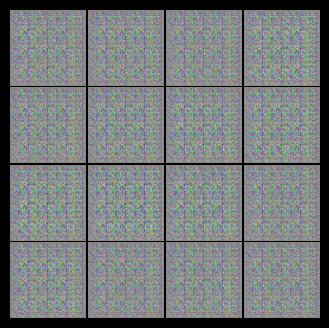

  0%|          | 0/40 [00:00<?, ?it/s]

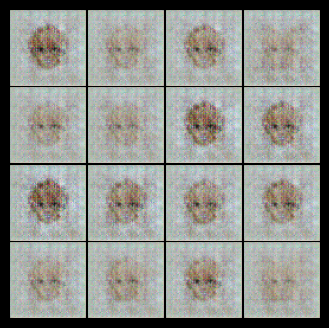

  0%|          | 0/40 [00:00<?, ?it/s]

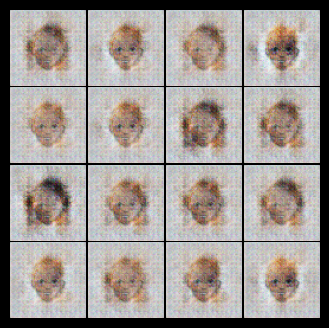

  0%|          | 0/40 [00:00<?, ?it/s]

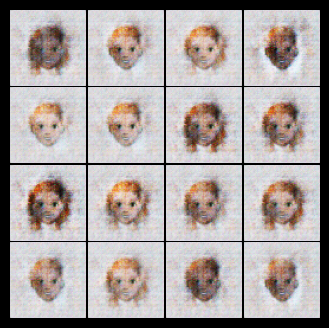

  0%|          | 0/40 [00:00<?, ?it/s]

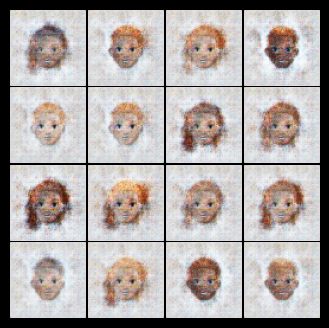

  0%|          | 0/40 [00:00<?, ?it/s]

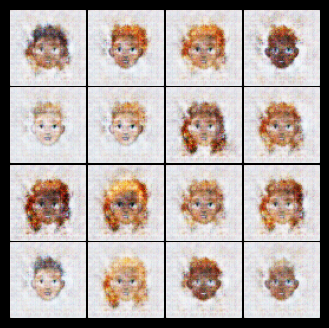

  0%|          | 0/40 [00:00<?, ?it/s]

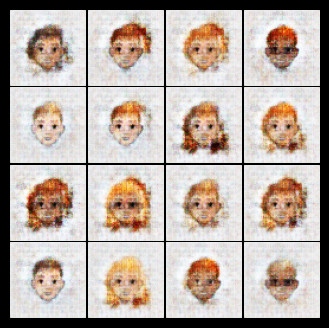

  0%|          | 0/40 [00:00<?, ?it/s]

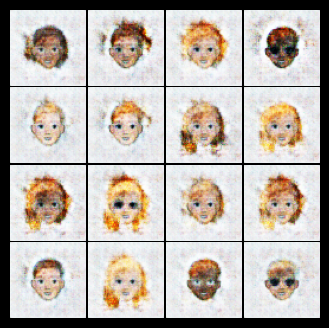

  0%|          | 0/40 [00:00<?, ?it/s]

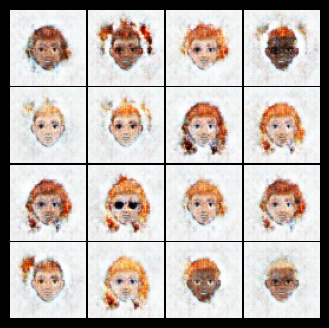

  0%|          | 0/40 [00:00<?, ?it/s]

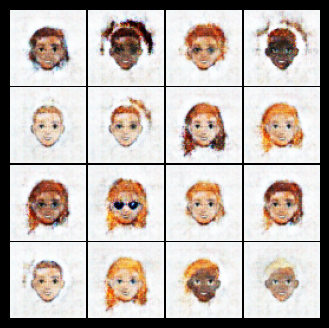

  0%|          | 0/40 [00:00<?, ?it/s]

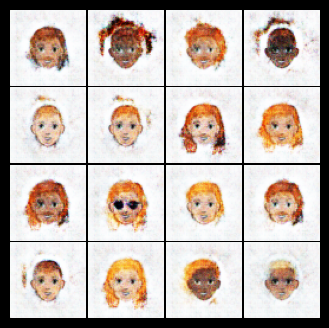

  0%|          | 0/40 [00:00<?, ?it/s]

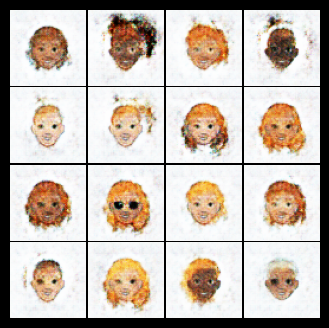

  0%|          | 0/40 [00:00<?, ?it/s]

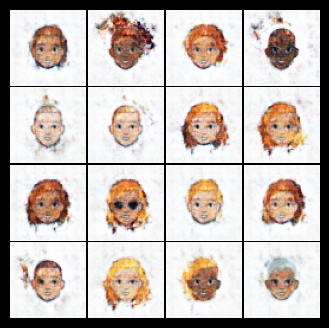

  0%|          | 0/40 [00:00<?, ?it/s]

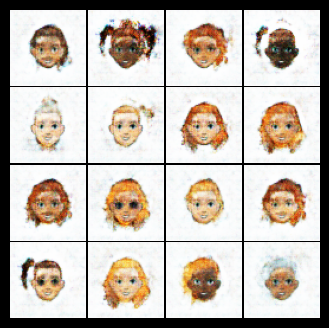

  0%|          | 0/40 [00:00<?, ?it/s]

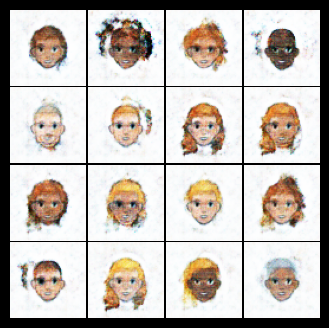

  0%|          | 0/40 [00:00<?, ?it/s]

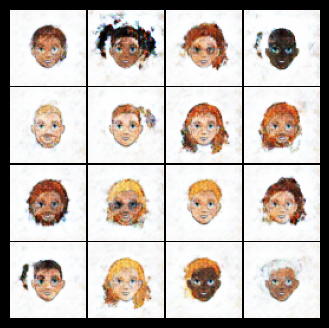

  0%|          | 0/40 [00:00<?, ?it/s]

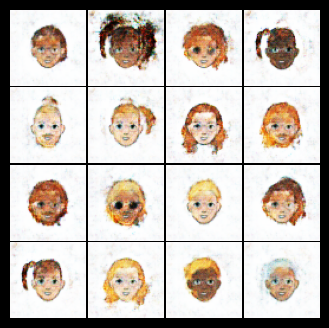

  0%|          | 0/40 [00:00<?, ?it/s]

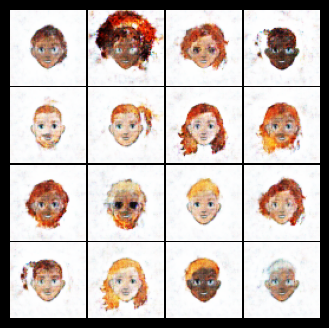

  0%|          | 0/40 [00:00<?, ?it/s]

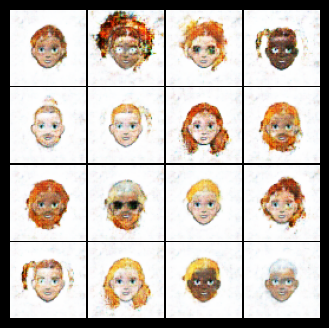

  0%|          | 0/40 [00:00<?, ?it/s]

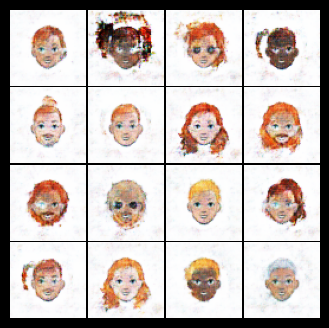

  0%|          | 0/40 [00:00<?, ?it/s]

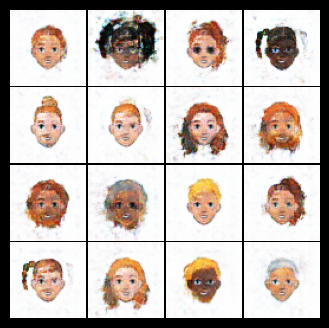

  0%|          | 0/40 [00:00<?, ?it/s]

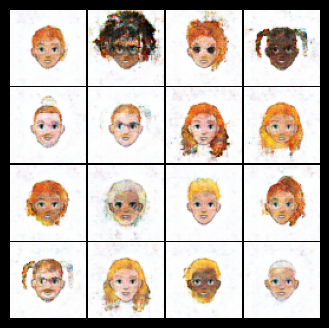

  0%|          | 0/40 [00:00<?, ?it/s]

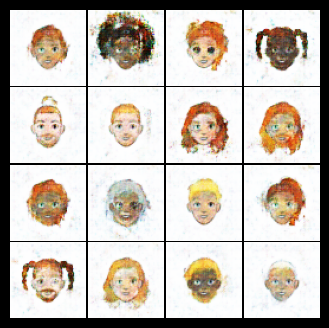

  0%|          | 0/40 [00:00<?, ?it/s]

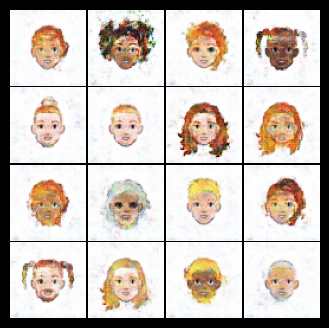

  0%|          | 0/40 [00:00<?, ?it/s]

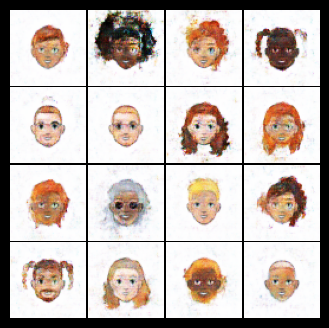

  0%|          | 0/40 [00:00<?, ?it/s]

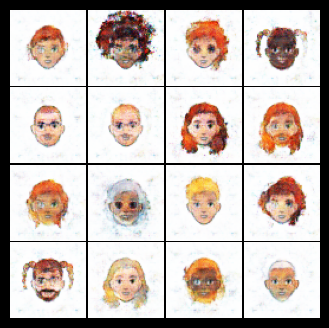

  0%|          | 0/40 [00:00<?, ?it/s]

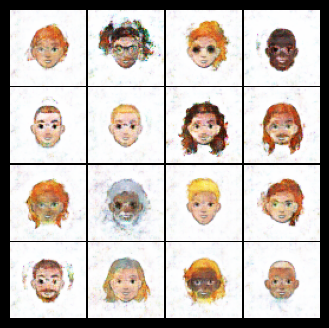

  0%|          | 0/40 [00:00<?, ?it/s]

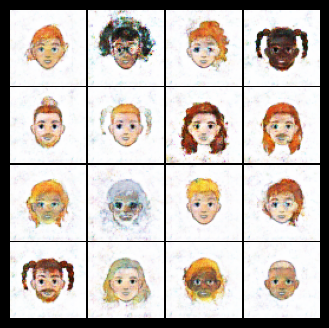

  0%|          | 0/40 [00:00<?, ?it/s]

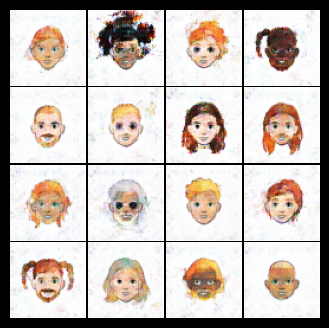

  0%|          | 0/40 [00:00<?, ?it/s]

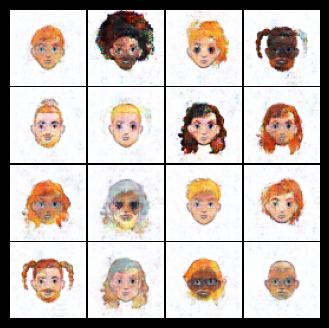

  0%|          | 0/40 [00:00<?, ?it/s]

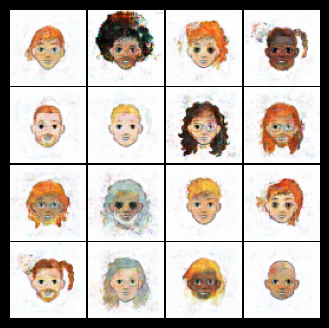

  0%|          | 0/40 [00:00<?, ?it/s]

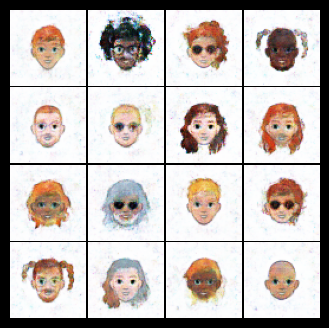

  0%|          | 0/40 [00:00<?, ?it/s]

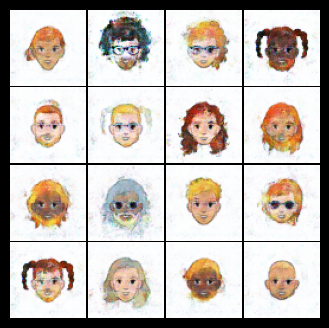

  0%|          | 0/40 [00:00<?, ?it/s]

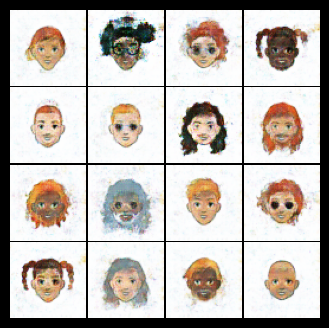

  0%|          | 0/40 [00:00<?, ?it/s]

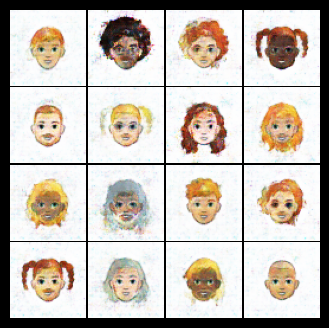

  0%|          | 0/40 [00:00<?, ?it/s]

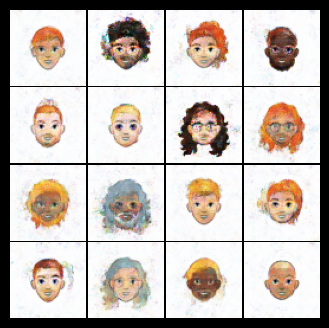

  0%|          | 0/40 [00:00<?, ?it/s]

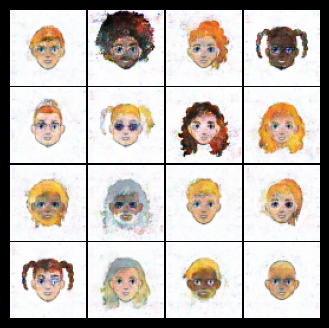

  0%|          | 0/40 [00:00<?, ?it/s]

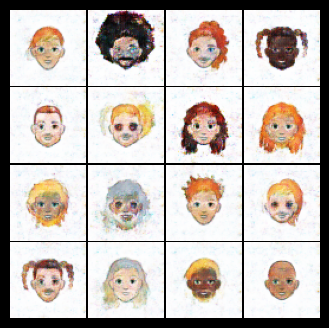

  0%|          | 0/40 [00:00<?, ?it/s]

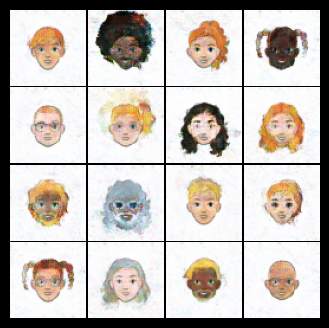

  0%|          | 0/40 [00:00<?, ?it/s]

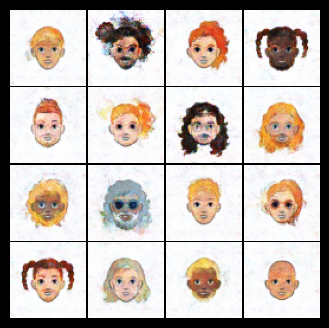

  0%|          | 0/40 [00:00<?, ?it/s]

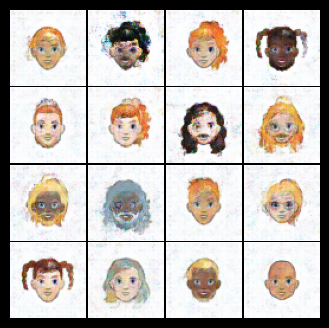

  0%|          | 0/40 [00:00<?, ?it/s]

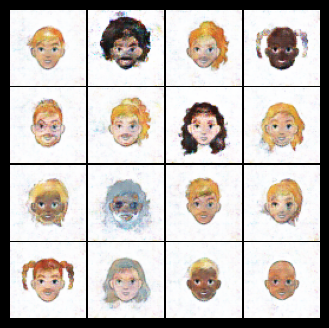

  0%|          | 0/40 [00:00<?, ?it/s]

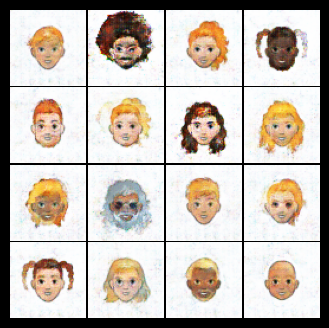

  0%|          | 0/40 [00:00<?, ?it/s]

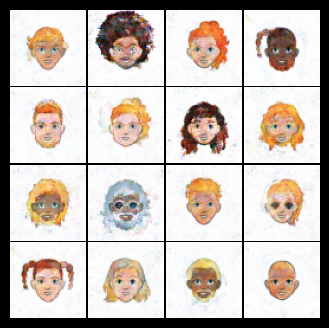

  0%|          | 0/40 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [15]:
result_df = train_gan(generator=generator,
                      discriminator=discriminator,
                      dataloader=dataloader,
                      criterion=criterion,
                      generator_optimizer=generator_optimizer,
                      discriminator_optimizer=discriminator_optimizer,
                      num_epochs=NUM_EPOCHS,
                      noise_size=NOISE_SIZE,
                      fixed_noises=fixed_noises,
                      save_generator_checkpoint_path=SAVE_GENERATOR_CHECKPOINT_PATH,
                      save_discriminator_checkpoint_path=SAVE_DISCRIMINATOR_CHECKPOINT_PATH,
                      save_fake_images_path=SAVE_FAKE_IMAGES_PATH,
                      log_file_path=SAVE_LOGS_PATH,
                      show_fake_images = True,
                      fake_images_grid_size = (4, 4))